# Project Part A: Exploratory Data Analysis

![](banner_project.jpg)

In [108]:
analyst = "Khoa Nguyen" # Replace this with your name

In [109]:
f = "setup.R"; for (i in 1:10) { if (file.exists(f)) break else f = paste0("../", f) }; source(f)
options(repr.matrix.max.rows=674)
update_geom_defaults("point", list(size=1))
update_geom_defaults("col", list(fill=PALETTE[1]))
out(5.8,2.1)

## Introduction

### Objective

Conduct an exploratory data analysis of public company fundamentals.  Later, use the insights gleaned along with additional analysis to recommend a portfolio of 12 company investments that maximizes 12-month return of an overall \$1,000,000 investment.

### Approach

Retrieve a public company fundamentals dataset comprising thousands of US companies from quarters 1, 2, 3, and 4 of year 2017 + company stock price data for those companies from quarter 4 of year 2018.

Prepare the data so that each company and its associated information is represented as a single observation.

Apply various descriptive statistics and data visualizations to look for interesting patterns and inter-company relationships.

### Data Source

Data files:

* Data Dictionary.csv
* Company Fundamentals 2017.csv
* Company Fundamentals 2018.csv

The datasets and accompanying data dictionary are sourced from ...

* Wharton Research Data Services > Compustat - Capital IQ from Standard & Poor's > North America - Daily > Fundamentals Quarterly (https://wrds-www.wharton.upenn.edu/)

  * Date Variable: Data Date
  * Date Range: 2017-01 to 2017-12 -or- 2018-01 to 2018-12
  * Company Codes: Search the entire database
    * Consolidtaion Level: C, Output
    * Industry Format: INDL, FS, Output
    * Data Format: STD, Output
    * Population Source: D, Output
    * Quarter Type: Fiscal View, Output
    * Currency: USD, Output (not CAD)
    * Company Status: Active, Output (not Inactive)
  * Variable Types: Data Items, Select All (674)
  * Query output:
    * Output format: comma-delimited text
    * Compression type: None
    * Data format: MMDDYY10

The datasets are restricted to select US active, publicly held companies that reported quarterly measures including stock prices for 1st, 2nd, 3rd, and 4th quarters in years 2017 and 2018.  All non-missing stock prices exceed $3 per share.  File formats are all comma-separated values (CSV).

The data dictionary is from Variable Descriptions tab, copied to Excel, saved in csv format.

_**For this project, do not source any additional data from year 2019.**_

## Data

### Data Dictionary

In [110]:
# Retrieve the data dictionary.
# How many variable entries in the company fundamentals datasets?
# What are the variable names, types, and descriptions?

dictionary = read.csv("Data Dictionary.csv", header=TRUE, na.strings=c("NA", ""), stringsAsFactors=FALSE)
fmtx(size(dictionary))
fmtx(dictionary)

observations,variables
674,4


Variable.Name,Data.Type,Variable.Description,Help
ACCHGQ,NUM,ACCHGQ -- Accounting Changes - Cumulative Effect,NA
ACCHGY,NUM,ACCHGY -- Accounting Changes - Cumulative Effect,NA
ACCTCHGQ,CHAR,ACCTCHGQ -- Adoption of Accounting Changes,NA
ACCTSTDQ,CHAR,ACCTSTDQ -- Accounting Standard,NA
ACOMINCQ,NUM,ACOMINCQ -- Accumulated Other Comprehensive Income (Loss),NA
ACOQ,NUM,ACOQ -- Current Assets - Other - Total,NA
ACTQ,NUM,ACTQ -- Current Assets - Total,NA
ADD1,CHAR,ADD1 -- Address Line 1,NA
ADD2,CHAR,ADD2 -- Address Line 2,NA
ADD3,CHAR,ADD3 -- Address Line 3,NA


### Data for Current Year

#### Retrieve Raw Data

In [ ]:
# Retrieve the 2017 data.
# How many observations and variables?
# Present the first few observations.

data.raw = read.csv("Company Fundamentals 2017.csv", header=TRUE, na.strings=c("NA", ""), stringsAsFactors=FALSE)

fmtx(size(data.raw))
fmtx(data.raw[1:10,], FFO)

observations,variables
"33,269",680


In [112]:
# How many unique companies?

# You can use length(unique(...))

unique_companies_in_current_year_dataset = length(unique(data.raw$gvkey))
fmtx(unique_companies_in_current_year_dataset)


unique_companies_in_current_year_dataset
"8,496"


#### Partition Data by Calendar Quarter 

Partition the dataset by calendar quarter in which information is reported. Filter in observations to include only those with non-missing `prccq` $\geq$ 3.  Then remove any observations about companies that reported more than once per quarter.  Then change all the variable names (except for the `gvkey`, `tic`, and `conm` variables) by suffixing them with quarter information - e.g., in the Quarter 1 dataset, `prccq` becomes `prccq.q1`, etc.

In [113]:
# Partition the dataset as described.
# How many observations and variables in each quarter dataset?

q = quarter(mdy(data.raw$datadate))

data.current.q1 = data.raw[(q==1) & !is.na(data.raw$prccq) & (data.raw$prccq>=3),]
data.current.q2 = data.raw[(q==2) & !is.na(data.raw$prccq) & (data.raw$prccq>=3),]
data.current.q3 = data.raw[(q==3) & !is.na(data.raw$prccq) & (data.raw$prccq>=3),]
data.current.q4 = data.raw[(q==4) & !is.na(data.raw$prccq) & (data.raw$prccq>=3),]

data.current.q1 = data.current.q1[!duplicated(data.current.q1$gvkey),]
data.current.q2 = data.current.q2[!duplicated(data.current.q2$gvkey),]
data.current.q3 = data.current.q3[!duplicated(data.current.q3$gvkey),]
data.current.q4 = data.current.q4[!duplicated(data.current.q4$gvkey),]

data.current.q1 = rename_with(data.current.q1, ~ifelse(. %in% c("gvkey","tic","conm"), ., paste0(.,".q1")))
data.current.q2 = rename_with(data.current.q2, ~ifelse(. %in% c("gvkey","tic","conm"), ., paste0(.,".q2")))
data.current.q3 = rename_with(data.current.q3, ~ifelse(. %in% c("gvkey","tic","conm"), ., paste0(.,".q3")))
data.current.q4 = rename_with(data.current.q4, ~ifelse(. %in% c("gvkey","tic","conm"), ., paste0(.,".q4")))


fmtsx(fmt(size(data.current.q1)),
      fmt(size(data.current.q2)),
      fmt(size(data.current.q3)),
      fmt(size(data.current.q4)))

observations,variables
"4,324",680
observations,variables
"4,387",680
observations,variables
"4,397",680
observations,variables
"4,434",680


#### Consolidate Data by Company

Consolidate the four quarter datasets into one dataset, with one observation per company that includes variables for all four quarters.  Remove any observations with missing `prccq.q4` values.

In [114]:
# Consolidate the partitions as described.
# How many observations and variables in the resulting dataset?
# Present the first few observations and some variables of the resulting dataset.

# You can use merge(..., ..., by=c("gvkey","tic","conm"), all=TRUE, sort=TRUE) threee times.
data.quarter.12 = merge(data.current.q1, data.current.q2,by=c("gvkey","tic","conm"), all=TRUE, sort=TRUE)
data.quarter.123 = merge(data.quarter.12, data.current.q3,by=c("gvkey","tic","conm"), all=TRUE, sort=TRUE)
data.current = merge(data.quarter.123, data.current.q4,by=c("gvkey","tic","conm"), all=TRUE, sort=TRUE)
data.current = data.current[!is.na(data.current$prccq.q4), ]

fmtx(size(data.current))
fmtx(data.current[1:3,1:13], "data.current (first few observations, first few variables)")


observations,variables
"4,434","2,711"


gvkey,tic,conm,datadate.q1,fyearq.q1,fqtr.q1,fyr.q1,indfmt.q1,consol.q1,popsrc.q1,datafmt.q1,cusip.q1,acctchgq.q1
"1,004",AIR,AAR CORP,02/28/2017,"2,016",3,5,INDL,C,D,STD,000361105,NA
"1,045",AAL,AMERICAN AIRLINES GROUP INC,03/31/2017,"2,017",1,12,INDL,C,D,STD,02376R102,NA
"1,050",CECE,CECO ENVIRONMENTAL CORP,03/31/2017,"2,017",1,12,INDL,C,D,STD,125141101,NA


### Data for Next Year

#### Retrieve Raw Data

In [115]:
# Retrieve the 2018 data.
# How many observations and variables?
# Present the first few observations.

data.raw = read.csv("Company Fundamentals 2018.csv", header=TRUE, na.strings=c("NA", ""), stringsAsFactors=FALSE)
fmtx(size(data.raw))
fmtx(data.raw[1:3,], FFO)

observations,variables
"35,728",680


gvkey,datadate,fyearq,fqtr,fyr,indfmt,consol,popsrc,datafmt,tic,cusip,conm,acctchgq,acctstdq,adrrq,ajexq,ajpq,bsprq,compstq,curcdq,curncdq,currtrq,curuscnq,datacqtr,datafqtr,finalq,ogmq,rp,scfq,srcq,staltq,updq,apdedateq,fdateq,pdateq,rdq,acchgq,acomincq,acoq,actq,altoq,ancq,anoq,aociderglq,aociotherq,aocipenq,aocisecglq,aol2q,aoq,apq,aqaq,aqdq,aqepsq,aqpl1q,aqpq,arcedq,arceepsq,arceq,atq,aul3q,billexceq,capr1q,capr2q,capr3q,capsftq,capsq,ceiexbillq,ceqq,cheq,chq,cibegniq,cicurrq,ciderglq,cimiiq,ciotherq,cipenq,ciq,cisecglq,citotalq,cogsq,csh12q,cshfd12,cshfdq,cshiq,cshopq,cshoq,cshprq,cstkcvq,cstkeq,cstkq,dcomq,dd1q,deracq,deraltq,derhedglq,derlcq,derlltq,diladq,dilavq,dlcq,dlttq,doq,dpacreq,dpactq,dpq,dpretq,drcq,drltq,dteaq,dtedq,dteepsq,dtepq,dvintfq,dvpq,epsf12,epsfi12,epsfiq,epsfxq,epspi12,epspiq,epspxq,epsx12,esopctq,esopnrq,esoprq,esoptq,esubq,fcaq,ffoq,finacoq,finaoq,finchq,findlcq,findltq,finivstq,finlcoq,finltoq,finnpq,finreccq,finrecltq,finrevq,finxintq,finxoprq,gdwlamq,gdwlia12,gdwliaq,gdwlid12,gdwlidq,gdwlieps12,gdwliepsq,gdwlipq,gdwlq,glaq,glcea12,glceaq,glced12,glcedq,glceeps12,glceepsq,glcepq,gldq,glepsq,glivq,glpq,hedgeglq,ibadj12,ibadjq,ibcomq,ibmiiq,ibq,icaptq,intaccq,intanoq,intanq,invfgq,invoq,invrmq,invtq,invwipq,ivaeqq,ivaoq,ivltq,ivstq,lcoq,lctq,lltq,lnoq,lol2q,loq,loxdrq,lqpl1q,lseq,ltmibq,ltq,lul3q,mibnq,mibq,mibtq,miiq,msaq,ncoq,niitq,nimq,niq,nopiq,npatq,npq,nrtxtdq,nrtxtepsq,nrtxtq,obkq,oepf12,oeps12,oepsxq,oiadpq,oibdpq,opepsq,optdrq,optfvgrq,optlifeq,optrfrq,optvolq,piq,pllq,pnc12,pncd12,pncdq,pnceps12,pncepsq,pnciapq,pnciaq,pncidpq,pncidq,pnciepspq,pnciepsq,pncippq,pncipq,pncpd12,pncpdq,pncpeps12,pncpepsq,pncpq,pncq,pncwiapq,pncwiaq,pncwidpq,pncwidq,pncwiepq,pncwiepsq,pncwippq,pncwipq,pnrshoq,ppegtq,ppentq,prcaq,prcd12,prcdq,prce12,prceps12,prcepsq,prcpd12,prcpdq,prcpeps12,prcpepsq,prcpq,prcraq,prshoq,pstknq,pstkq,pstkrq,rcaq,rcdq,rcepsq,rcpq,rdipaq,rdipdq,rdipepsq,rdipq,recdq,rectaq,rectoq,rectq,rectrq,recubq,req,retq,reunaq,revtq,rllq,rra12,rraq,rrd12,rrdq,rreps12,rrepsq,rrpq,rstcheltq,rstcheq,saleq,seqoq,seqq,seta12,setaq,setd12,setdq,seteps12,setepsq,setpq,spce12,spced12,spcedpq,spcedq,spceeps12,spceepsp12,spceepspq,spceepsq,spcep12,spcepd12,spcepq,spceq,spidq,spiepsq,spioaq,spiopq,spiq,sretq,stkcoq,stkcpaq,teqq,tfvaq,tfvceq,tfvlq,tieq,tiiq,tstknq,tstkq,txdbaq,txdbcaq,txdbclq,txdbq,txdiq,txditcq,txpq,txtq,txwq,uacoq,uaoq,uaptq,ucapsq,ucconsq,uceqq,uddq,udmbq,udoltq,udpcoq,udvpq,ugiq,uinvq,ulcoq,uniamiq,unopincq,uopiq,updvpq,upmcstkq,upmpfq,upmpfsq,upmsubpq,upstkcq,upstkq,urectq,uspiq,usubdvpq,usubpcvq,utemq,wcapq,wdaq,wddq,wdepsq,wdpq,xaccq,xidoq,xintq,xiq,xoprq,xopt12,xoptd12,xoptd12p,xoptdq,xoptdqp,xopteps12,xoptepsp12,xoptepsq,xoptepsqp,xoptq,xoptqp,xrdq,xsgaq,acchgy,afudccy,afudciy,amcy,aolochy,apalchy,aqay,aqcy,aqdy,aqepsy,aqpy,arcedy,arceepsy,arcey,capxy,cdvcy,chechy,cibegniy,cicurry,cidergly,cimiiy,ciothery,cipeny,cisecgly,citotaly,ciy,cogsy,cshfdy,cshpry,cstkey,depcy,derhedgly,dilady,dilavy,dlcchy,dltisy,dltry,doy,dpcy,dprety,dpy,dteay,dtedy,dteepsy,dtepy,dvpy,dvy,epsfiy,epsfxy,epspiy,epspxy,esubcy,esuby,exrey,fcay,ffoy,fiaoy,fincfy,finrevy,finxinty,finxopry,fopoxy,fopoy,fopty,fsrcoy,fsrcty,fuseoy,fusety,gdwlamy,gdwliay,gdwlidy,gdwliepsy,gdwlipy,glay,glceay,glcedy,glceepsy,glcepy,gldy,glepsy,glivy,glpy,hedgegly,ibadjy,ibcomy,ibcy,ibmiiy,iby,intpny,invchy,itccy,ivacoy,ivchy,ivncfy,ivstchy,miiy,ncoy,niity,nimy,niy,nopiy,nrtxtdy,nrtxtepsy,nrtxty,oancfy,oepsxy,oiadpy,oibdpy,opepsy,optdry,optfvgry,optlifey,optrfry,optvoly,pdvcy,piy,plly,pncdy,pncepsy,pnciapy,pnciay,pncidpy,pncidy,pnciepspy,pnciepsy,pncippy,pncipy,pncpdy,pncpepsy,pncpy,pncwiapy,pncwiay,pncwidpy,pncwidy,pncwiepsy,pncwiepy,pncwippy,pncwipy,pncy,prcay,prcdy,prcepsy,prcpdy,prcpepsy,prcpy,prstkccy,prstkcy,prstkpcy,rcay,rcdy,rcepsy,rcpy,rdipay,rdipdy,rdipepsy,rdipy,recchy,revty,rray,rrdy,rrepsy,rrpy,saley,scstkcy,setay,setdy,setepsy,setpy,sivy,spcedpy,spcedy,spceepspy,spceepsy,spcepy,spcey,spidy,spiepsy,spioay,spiopy,spiy,sppey

#### Filter Data by Calendar Quarter 4 

Filter the dataset by calendar quarter in which information is reported, keeping only observations with information reported in quarter 4. Additionally, filter in observations to include only those with non-missing `prccq`, and keep only the `gvkey` and `prccq` variables.  Then remove any observations about companies that reported more than once per quarter.

In [116]:
# Filter the dataset as described.
# Present the first few observations of the resulting dataset. 
q = quarter(mdy(data.raw$datadate))

data.future.q4 = data.raw[(q==4) & !is.na(data.raw$prccq), ]

data.future.q4 = data.future.q4[!duplicated(data.future.q4$gvkey), c("gvkey","prccq")]


fmtsx(fmt(size(data.future.q4)))
fmtx(data.future.q4[1:6,], FFO)


observations,variables
"5,968",2


gvkey,prccq
"1,004",43.69
"1,045",32.11
"1,050",6.75
"1,062",8.66
"1,072",15.25
"1,075",85.20


### Data for Consolidated Current Year / Next Year

Consolidate the processed 2017 dataset and processed 2018 dataset, keeping only observations that have both 2017 and 2018 information.  Then add these 2 synthetic variables:

<p style="text-indent: 15px;">
$\begin{align}
\textsf{growth} & = \left( \textsf{prccq} - \textsf{prccq.q4} \right) \div \textsf{prccq.q4} \\
\textsf{big growth} & = \textsf{growth} \geq 0.3
\end{align}$

In [117]:
# Consolidate the datasets as described.
# How many observations and variables in the resulting dataset?
# Present the first few observations of the resulting dataset.

threshold = 0.3

data = merge(data.current, data.future.q4, by="gvkey", all=FALSE)

data$growth = (data$prccq - data$prccq.q4) / data$prccq.q4
data$big_growth = factor(data$growth >= threshold, levels=c(TRUE, FALSE), labels=c("YES", "NO"))

data = relocate(data, big_growth, growth, prccq) 


fmtx(size(data))
fmtx(data[1:3, 1:13], "data (first few observations, first few variables)")
# fmtx(data[1:3,], FFO)  # takes about 2 minutes to display all variables

observations,variables
"4,305","2,714"


big_growth,growth,prccq,gvkey,tic,conm,datadate.q1,fyearq.q1,fqtr.q1,fyr.q1,indfmt.q1,consol.q1,popsrc.q1
NO,0.0507,43.69,"1,004",AIR,AAR CORP,02/28/2017,"2,016",3,5,INDL,C,D
NO,-0.3829,32.11,"1,045",AAL,AMERICAN AIRLINES GROUP INC,03/31/2017,"2,017",1,12,INDL,C,D
YES,0.3158,6.75,"1,050",CECE,CECO ENVIRONMENTAL CORP,03/31/2017,"2,017",1,12,INDL,C,D


## Exploratory Data Analysis

### Descriptive Statistics

In [118]:
# How many observations and variables?
fmtx(size(data))


observations,variables
"4,305","2,714"


In [119]:
# Present a variety of statistics about growth. 
growth = describe(data$growth)
fmtx(growth)


vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
1,"4,305",-0.1186,0.4689,-0.1492,-0.1519,0.2629,-0.9956,10.24,11.24,6.58,102.6,0.0071


In [120]:
# What is the correlation between prccq.q4 and prccq?
# What is the correlation between prccq.q4 and growth?
prccq.q4_prccqq = cor(data$prccq, data$prccq.q4)
prccq.q4_growth = cor(data$growth, data$prccq.q4)
correlations = data.frame(prccq.q4_prccqq,prccq.q4_growth)
fmtx(correlations)


prccq.q4_prccqq,prccq.q4_growth
0.9603,0.0088


In [121]:
# What fraction of observations are missing price data
# (i.e, what fraction are missing data from any of prccq.q1, prccq.q2, prccq.q3, or prccq.q4)?

fmtsx(fmt(sum(is.na(data$prccq.q1) | 
        is.na(data$prccq.q2) | 
        is.na(data$prccq.q3) )/nrow(data), "faction of observations with missing price data", blank=TRUE))
           

""
0.0857


In [122]:
# Present some additional interesting descriptive statistics.

cov.1_2_3_4_growth = cov(data[,c("prccq.q1","prccq.q2","prccq.q3","prccq.q4","growth","prccq")]) # covariance

fmtsx(fmt(cov.1_2_3_4_growth, "Covariance between quarters", row.names=TRUE))

,prccq.q1,prccq.q2,prccq.q3,prccq.q4,growth,prccq
prccq.q1,NA,NA,NA,NA,NA,NA
prccq.q2,NA,NA,NA,NA,NA,NA
prccq.q3,NA,NA,NA,NA,NA,NA
prccq.q4,NA,NA,NA,"105,973.371",1.3476,"96,525.580"
growth,NA,NA,NA,1.348,0.2199,6.469
prccq,NA,NA,NA,"96,525.580",6.4690,"95,345.195"


In [123]:
# Present some additional interesting descriptive statistics. 
fmtsx(fmt(sum(data$big_growth == "YES")/nrow(data), "faction of observations as big growth", blank=TRUE))

""
0.0836


In [124]:
# Present some additional interesting descriptive statistics.
as.data.frame(describe(data[,c("prccq.q1","prccq.q2","prccq.q3","prccq.q4","prccq","growth")]))[,c(
    'mean','sd','median','min','max', 'range')]


,mean,sd,median,min,max,range
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
prccq.q1,51.8391,295.4245,24.5750,3.0190,14000.00,13996.98
prccq.q2,52.9379,314.5788,24.2600,3.0000,14000.00,13997.00
prccq.q3,54.9956,350.7298,24.9200,3.0000,15500.00,15497.00
prccq.q4,54.7038,325.5355,24.6922,3.0000,14000.00,13997.00
prccq,49.5639,308.7802,20.9800,0.0250,14450.00,14449.98
growth,-0.1186,0.4689,-0.1492,-0.9956,10.24,11.24


### Data Visualization

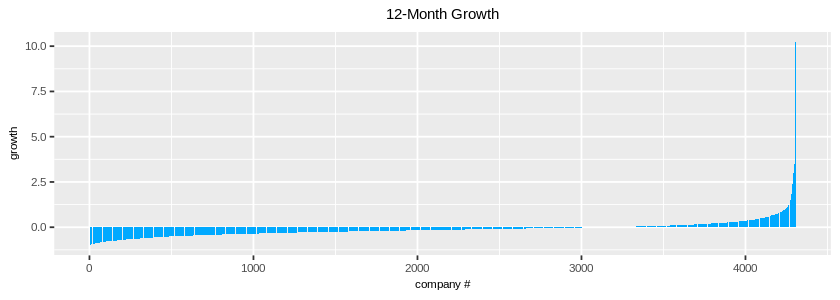

In [125]:
# Present a barchart to visualize growth across companies (sorted lowest to highest).
# You can use geom_col(aes(x=rank(growth, ties.method="first"), y=growth))
out(7,2.5)
ggplot(data) + geom_col(aes(x=rank(growth, ties.method="first"), y=growth)) +
ylab("growth") + xlab("company #") + ggtitle("12-Month Growth")

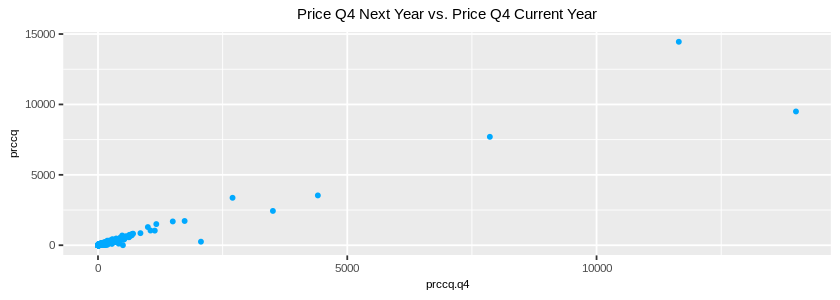

In [126]:
# Present a scatterplot to visualize correlation of price at Q4 next year vs. price at Q4 current year.
out(7,2.5)
ggplot(data) + geom_point(aes(x=prccq.q4, y=prccq)) +
ylab("prccq") + xlab("prccq.q4") + ggtitle("Price Q4 Next Year vs. Price Q4 Current Year")

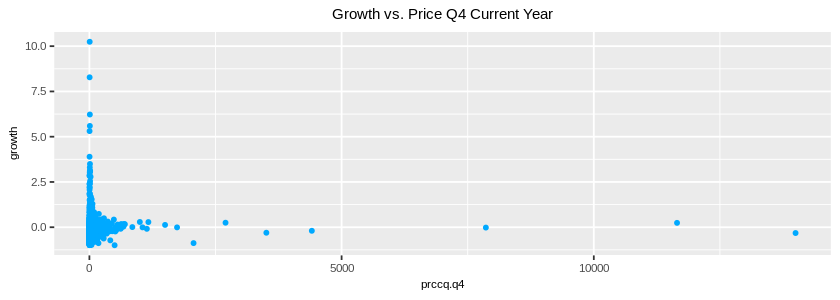

In [127]:
# Present a scatterplot to visualize correlation of growth vs. price at Q4 current year.
out(7,2.5)
ggplot(data) + geom_point(aes(x=prccq.q4, y=growth)) +
ylab("growth") + xlab("prccq.q4") + ggtitle("Growth vs. Price Q4 Current Year")


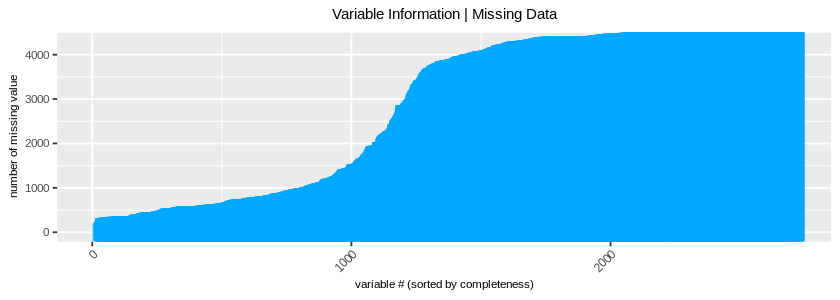

In [128]:
# Present a barchart to visualize the number of missing data across variables
# (variables on the horizontal axis sorted by most complete to least complete,
#  number of missing values on the vertical axis).
#
# You can use data.frame(na_count=as.numeric(summarize_all(data, ~sum(is.na(.)))))
# You can use geom_col(aes(x=rank(na_count, ties.method="first"), ...))
ggplot(data.frame(na_count=as.numeric(summarize_all(data, ~sum(is.na(.)))))) + 
 geom_col(aes(x=rank(na_count, ties.method="first"), y = na_count), color=PALETTE[1]) +
ggtitle("Variable Information | Missing Data") + xlab("variable # (sorted by completeness)") +
ylab("number of missing value") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) 


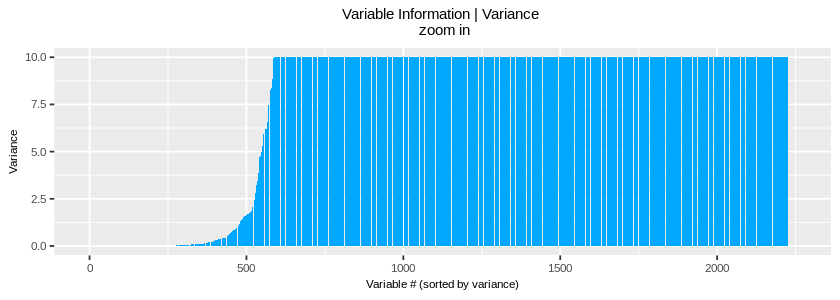

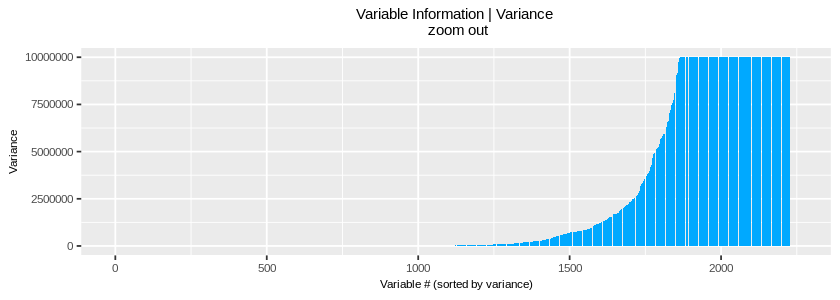

In [129]:
# Present a barchart to visualize variance across variables
# (only for numerical variables, sorted lowest to highest, zoom in to 0≤variance≤10, zoom out to 00≤variance≤10000000).
#
# You can use select_if(..., ...)
# You can use as.numeric(summarize_all(..., ...))
# You can use pmin(..., ...)

data.col = data.frame(variance=as.numeric(summarize_all(select_if(data, ~is.numeric(.)), ~var(., na.rm=TRUE))))

# Create the barchart


ggplot(data.col) +
 geom_col(aes(x = rank(variance, ties.method = "first"), y = pmin(10, variance))) +
 xlim(0, 2250) +
 ylim(0, 10) +
 ggtitle("Variable Information | Variance \n zoom in") +
 xlab("Variable # (sorted by variance)") +
 ylab("Variance")

ggplot(data.col) +
 geom_col(aes(x = rank(variance, ties.method = "first"), y = pmin(10000000, variance))) +
 xlim(0, 2250) +
 ylim(0, 10000000) +
 ggtitle("Variable Information | Variance \n zoom out")+
xlab("Variable # (sorted by variance)") +
 ylab("Variance")


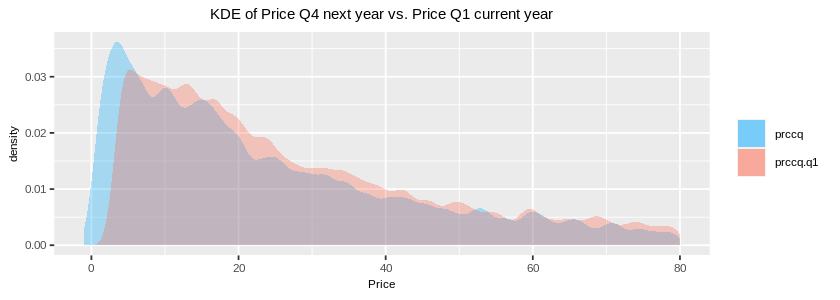

In [130]:
# Present an additional interesting data visualization. 
out(7,2.5)
ggplot(data)+ xlim(-1,80) + 
geom_density(aes(prccq, fill="prccq"), kernel="gaussian", bw=1, alpha = 0.3) + 
geom_density(aes(prccq.q1,fill="prccq.q1"), kernel="gaussian", bw=1, alpha = 0.3) +
scale_color_manual(values=c("prccq"=PALETTE[1], "prccq.q1"=PALETTE[3])) +xlab("Price") +
ggtitle("KDE of Price Q4 next year vs. Price Q1 current year")



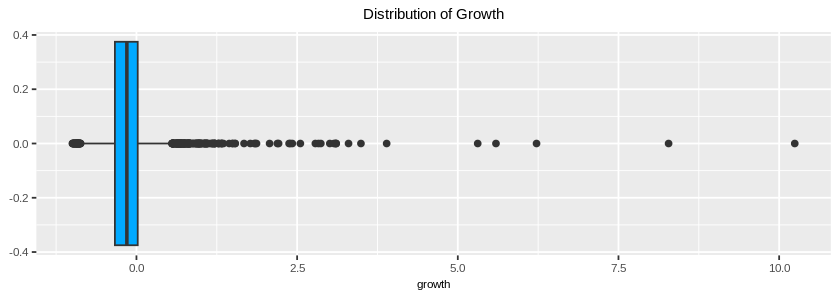

In [131]:
# Present an additional interesting data visualization. 
ggplot(data) + geom_boxplot(aes(x = growth), fill=PALETTE[1]) +
ggtitle("Distribution of Growth") 

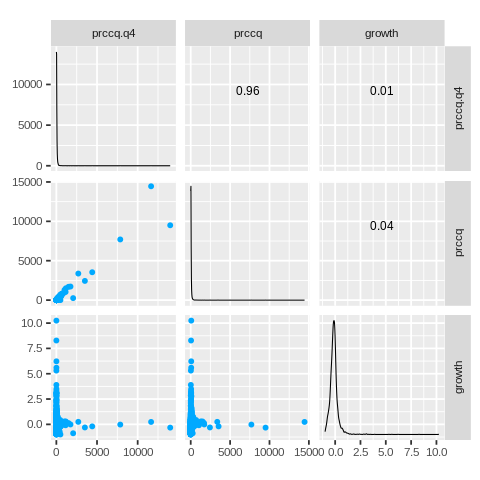

In [132]:
# Present an additional interesting data visualization. 
out(4,4)
ggscatmat(data[,c("prccq.q4","prccq","growth")])

### Store Data

In [133]:
# Store the preapred data (4305 observations, 2714 variables)
write.csv(data, "My Prepared Data.csv", row.names=FALSE)

<p style="text-align:left; font-size:10px;">
Copyright (c) Huntsinger Associates, LLC
<span style="float:right;">
Document revised May 6, 2023
</span>
</p>